## Percobaan 2

Ekualisasi, Median, Gauss

In [3]:
import os
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_predict
from sklearn.metrics import accuracy_score, classification_report
from skimage.feature import graycomatrix, graycoprops
from scipy.stats import entropy
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
from sklearn.metrics import (confusion_matrix, ConfusionMatrixDisplay)
import seaborn as sns

## Data Loading

In [4]:
data = []
labels = []
file_name = []

for sub_folder in os.listdir("dataset\\"):
    sub_folder_files = os.listdir(os.path.join("dataset\\", sub_folder))
    for i, filename in enumerate(sub_folder_files):
        img_path = os.path.join("dataset\\", sub_folder, filename)
        img = cv.imread(img_path)
        if img is not None:
            img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)  # Konversi ke grayscale
            img = cv.resize(img, (150, 150))           # Resize ke ukuran tetap
            img = img.astype(np.uint8)                 # Tipe data sesuai

            data.append(img)
            labels.append(sub_folder)
            file_name.append(filename)

data = np.array(data)
labels = np.array(labels)


## Data Augmentation

### Define Augmentation Function

In [5]:
def augmentasi(img):
    augmented_images = []
    # Flip horizontal
    augmented_images.append(cv.flip(img, 1))
    # Flip vertical
    augmented_images.append(cv.flip(img, 0))
    # Rotasi 90 derajat
    augmented_images.append(cv.rotate(img, cv.ROTATE_90_CLOCKWISE))
    # Rotasi 180 derajat
    augmented_images.append(cv.rotate(img, cv.ROTATE_180))
    return augmented_images

In [6]:
# melakukan augmentasi data
data_augmented = []
labels_augmented = []
file_name_augmented = []

for i in range(len(data)):
	# gambar asli
	data_augmented.append(data[i])
	labels_augmented.append(labels[i])
	file_name_augmented.append(file_name[i])
	
	# augmentasi gambar
	augmented_imgs = augmentasi(data[i])
	for idx, aug_img in enumerate(augmented_imgs):
		data_augmented.append(aug_img)
		labels_augmented.append(labels[i])
		file_name_augmented.append(f"{file_name[i]}_aug{idx+1}")

data_augmented = np.array(data_augmented)
labels_augmented = np.array(labels_augmented)
file_name_augmented = np.array(file_name_augmented)

In [7]:
print("Data sebelum augmentasi: ", len(data))
print("Data setelah augmentasi: ", len(data_augmented))

Data sebelum augmentasi:  490
Data setelah augmentasi:  2450


## Data Preparation

### Define Preprocessing

In [8]:
def histogram_equalization(img_gray):
    hist, bins = np.histogram(img_gray.flatten(), bins=256, range=[0,255])
    cdf = hist.cumsum()
    cdf_normalized = cdf * 255 / cdf[-1]
    img_eq = np.interp(img_gray.flatten(), bins[:-1], cdf_normalized)
    return img_eq.reshape(img_gray.shape).astype(np.uint8)

def median(arr):
    n = len(arr)
    sorted_arr = sorted(arr)
    if n % 2 == 0:
        median1 = sorted_arr[n//2]
        median2 = sorted_arr[n//2 - 1]
        median = (median1 + median2)/2
    else:
        median = sorted_arr[n//2]
        
    return median

def filter_median(image, kernel):
    # mengambil nilai shape dari variabel image dan kernel 
    heightImage, widthImage = image.shape
    heightKernel, widthKernel = kernel.shape
    # melakukan perhitungan untuk mencari nilai tengah 
    heigthCenter = int((heightKernel - 1)/2)
    widthCenter = int((widthKernel - 1)/2)

    # proses padding 
    leftPad = widthCenter
    rightPad = widthKernel - widthCenter
    topPad = heigthCenter
    botPad = heightKernel - heigthCenter
    image = np.pad(image, ((leftPad, rightPad), (topPad, botPad)), mode='edge')

    result = np.zeros([heightImage, widthImage])
    # proses konvolusi
    for i in range(heightImage):
         for j in range(widthImage):
             temp = np.zeros(len(kernel)*len(kernel))
             indeks = 0
             for k in range(heightKernel):
                 for l in range(widthKernel):
                     temp[indeks] += image[i+k,j+l]
                     indeks+=1
                     result[i,j] = median(temp)
             
    return np.clip(result, 0, 255).astype(np.uint8)

def filter_image(image, kernel):
    HtoInt = int((kernel.shape[0] - 1) / 2)
    WtoInt = int((kernel.shape[1] - 1) / 2)
    PaddingKanan = kernel.shape[1] - WtoInt
    PaddingBawah = kernel.shape[0] - HtoInt
    result = np.zeros(image.shape)
    imgs = np.pad(image, ((HtoInt, PaddingBawah), (WtoInt, PaddingKanan)), mode='edge')
    
    for i in range(result.shape[0]):
        for j in range(result.shape[1]):
            pixel = 0
            for k in range(kernel.shape[0]):
                for l in range(kernel.shape[1]):
                    pixel += imgs[i + k, j + l] * kernel[k, l]
            result[i, j] = pixel
            
    return result

## Preprocessing

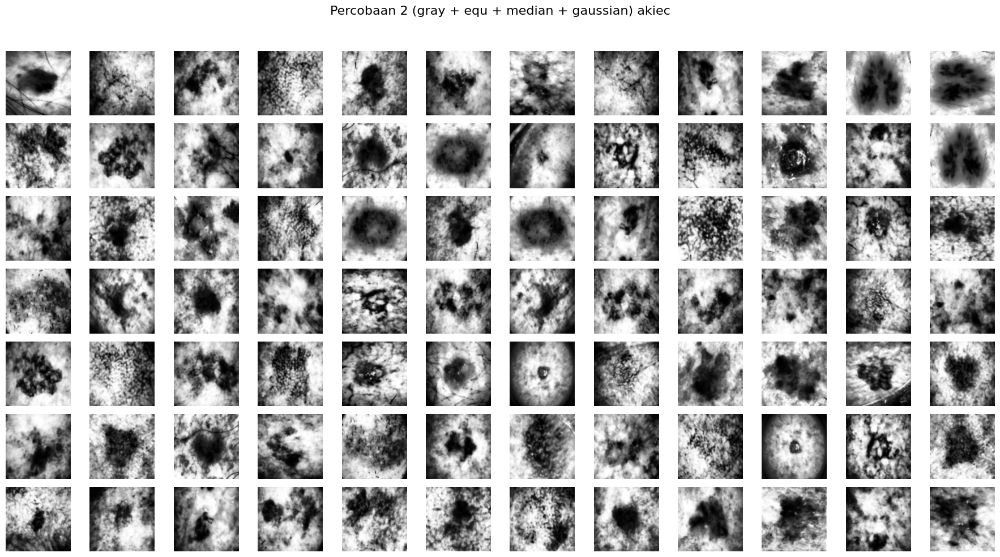

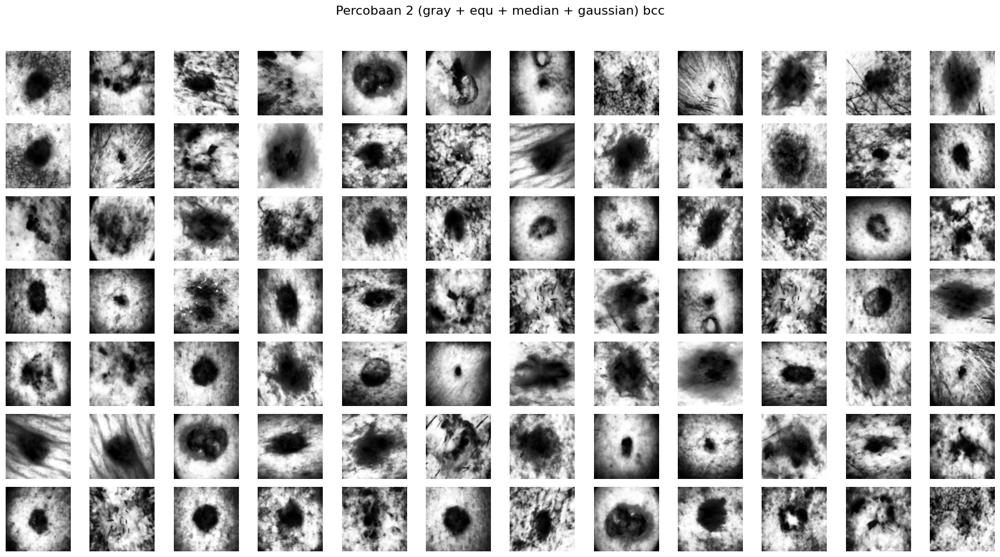

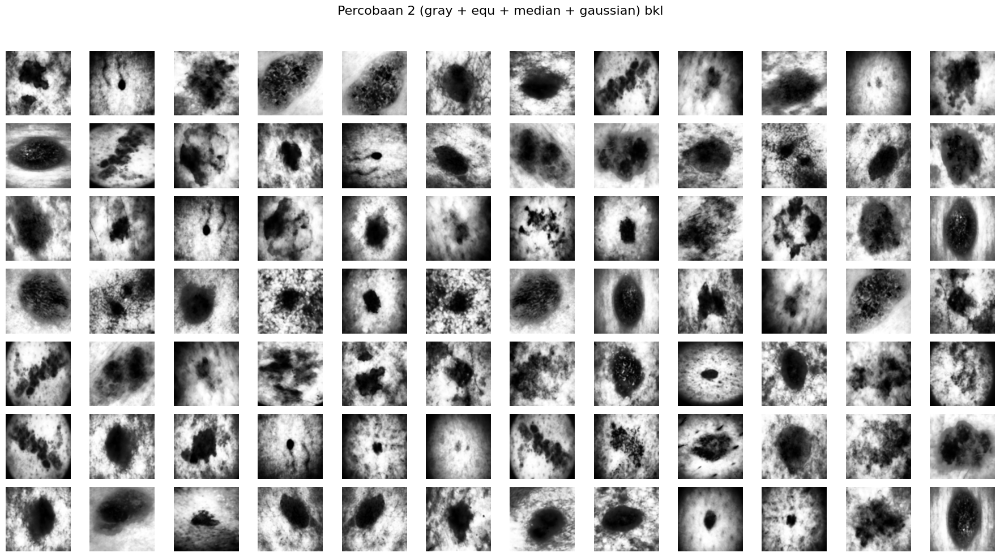

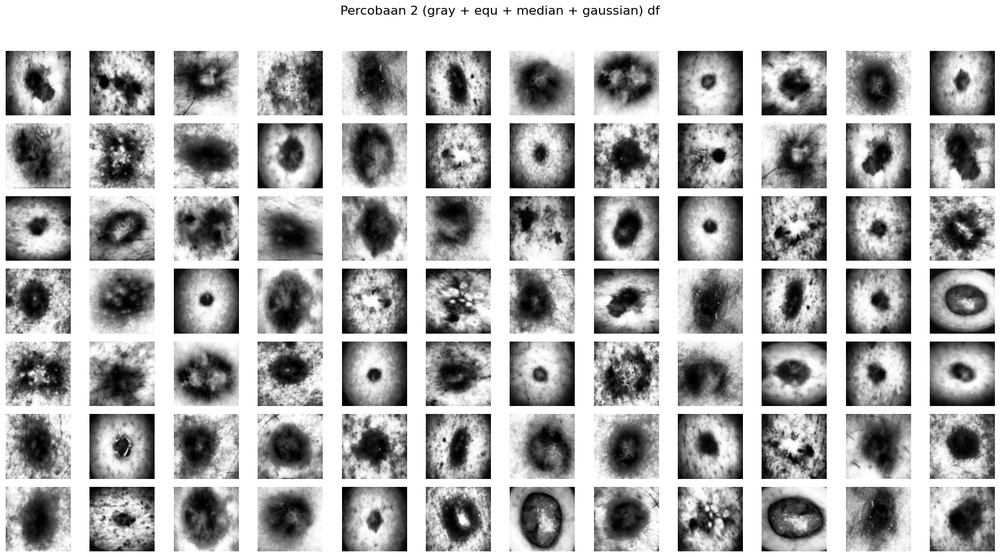

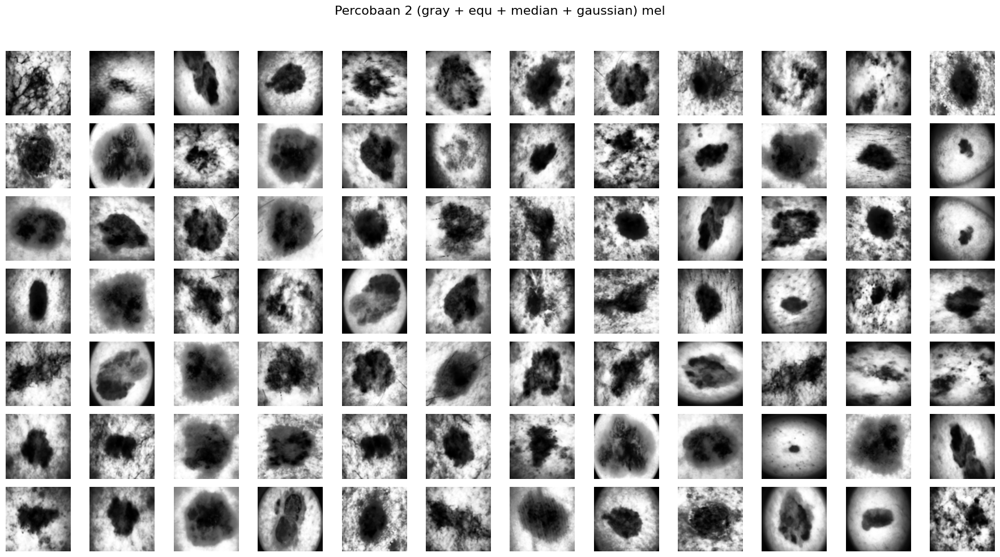

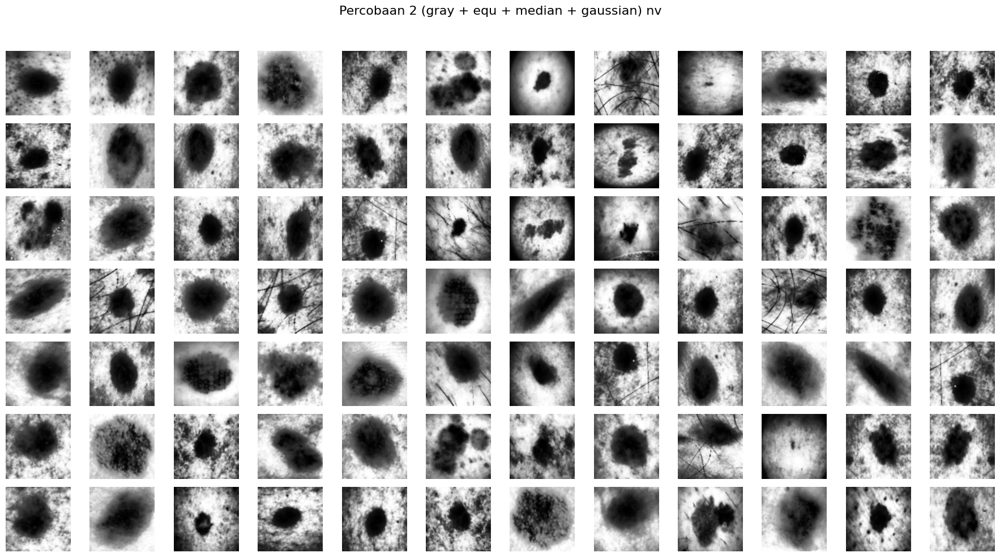

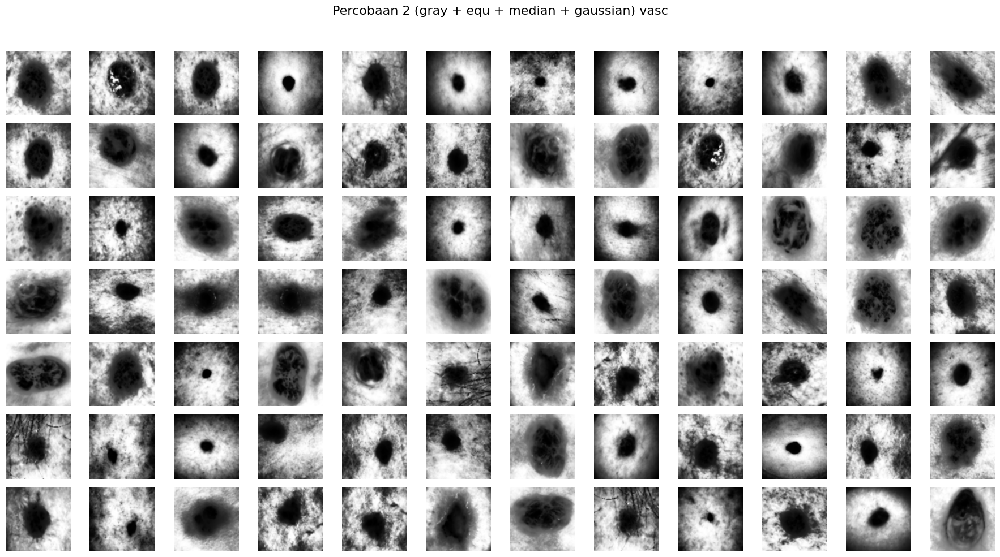

In [11]:
# Gaussian kernel 3x3
gaussian_kernel = (1/16) * np.array([[1, 2, 1],
                                     [2, 4, 2],
                                     [1, 2, 1]])

def percobaan2(gray):
    img_eq = histogram_equalization(gray)
    img_median = filter_median(img_eq, np.ones((3, 3), dtype=np.uint8))
    img_gaus = filter_image(img_median, gaussian_kernel)
    return img_gaus

dataPreprocessed = [percobaan2(img) for img in data_augmented]  

unique_labels = sorted(set(labels_augmented))

for label in unique_labels:
    idxs = [j for j, l in enumerate(labels_augmented) if l == label]
    idxs = np.random.choice(idxs, size=min(84, len(idxs)), replace=False)  # Ambil 84 gambar acak
    n_imgs = len(idxs)
    n_rows, n_cols = 7, 12
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(18, 10))
    fig.suptitle(f'Percobaan 2 (gray + equ + median + gaussian) {label}', fontsize=16)
    
    for k in range(n_rows * n_cols):
        row = k // n_cols
        col = k % n_cols
        ax = axs[row][col]
        if k < n_imgs:
            ax.imshow(dataPreprocessed[idxs[k]], cmap='gray')
        ax.axis('off')
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()


## Ekstraksi Fitur

In [12]:
def glcm(image, derajat):
    if derajat == 0:
        angles = [0]
    elif derajat == 45:
        angles = [np.pi / 4]
    elif derajat == 90:
        angles = [np.pi / 2]
    elif derajat == 135:
        angles = [3 * np.pi / 4]
    else:
        raise ValueError("Invalid angle. It should be one of the following: 0, 45, 90, 135.")
    
    # mengembalikan matrix glcm dari image
    glcm = graycomatrix(image, [1], angles, 256, symmetric=True, normed=True)
    
    return glcm

In [13]:
def correlation(matriks):
	return graycoprops(matriks, 'correlation')[0, 0]

def dissimilarity(matriks):
    return graycoprops(matriks, 'dissimilarity')[0, 0]

def homogenity(matriks):
    return graycoprops(matriks, 'homogeneity')[0, 0]

def contrast(matriks):
    return graycoprops(matriks, 'contrast')[0, 0]

def ASM(matriks):
    return graycoprops(matriks, 'ASM')[0, 0]

def energy(matriks):
    return graycoprops(matriks, 'energy')[0, 0]

def entropyGlcm(matriks):
    return entropy(matriks.ravel())

In [ ]:
# Fungsi ekstraksi fitur untuk list citra
def ekstrak_fitur_glcm(data, nama_prepro):
    fitur_list = []
    for img in data:
        img_u8 = img.astype(np.uint8)
        m = glcm(img_u8, 0)  # derajat 0
        
        fitur = {
            'contrast': contrast(m),
            'correlation': correlation(m),
            'energy': energy(m),
            'homogeneity': homogenity(m),
            'dissimilarity': dissimilarity(m),
            'ASM': ASM(m),
            'entropy': entropyGlcm(m)
        }
        fitur_list.append(fitur)

    df = pd.DataFrame(fitur_list)
    df['tahap'] = nama_prepro
    return df

df2 = ekstrak_fitur_glcm(dataPreprocessed, 'percobaan2')
display(df2)

,contrast,correlation,energy,homogeneity,dissimilarity,ASM,entropy,tahap
0,74.611409,0.993042,0.015566,0.183236,6.296421,0.000242,8.767102,percobaan2
1,74.611409,0.993042,0.015566,0.183236,6.296421,0.000242,8.767102,percobaan2
2,74.611409,0.993042,0.015566,0.183236,6.296421,0.000242,8.767102,percobaan2
3,51.630336,0.995199,0.016890,0.222846,5.003579,0.000285,8.568895,percobaan2
4,74.611409,0.993042,0.015566,0.183236,6.296421,0.000242,8.767102,percobaan2
...,...,...,...,...,...,...,...,...
2445,98.310828,0.990904,0.016700,0.212088,6.575705,0.000279,8.710763,percobaan2
2446,98.310828,0.990904,0.016700,0.212088,6.575705,0.000279,8.710763,percobaan2
2447,98.310828,0.990904,0.016700,0.212088,6.575705,0.000279,8.710763,percobaan2
2448,58.391544,0.994630,0.018663,0.253152,5.071544,0.000348,8.491618,percobaan2


In [18]:
Derajat0, Derajat45, Derajat90, Derajat135 = [], [], [], []
Kontras0, Kontras45, Kontras90, Kontras135 = [], [], [], []
dissimilarity0, dissimilarity45, dissimilarity90, dissimilarity135 = [], [], [], []
homogenity0, homogenity45, homogenity90, homogenity135 = [], [], [], []
entropy0, entropy45, entropy90, entropy135 = [], [], [], []
ASM0, ASM45, ASM90, ASM135 = [], [], [], []
energy0, energy45, energy90, energy135 = [], [], [], []
correlation0, correlation45, correlation90, correlation135 = [], [], [], []

for img in dataPreprocessed:
    D0 = glcm(img.astype(np.uint8), 0)
    D45 = glcm(img.astype(np.uint8), 45)
    D90 = glcm(img.astype(np.uint8), 90)
    D135 = glcm(img.astype(np.uint8), 135)
    Derajat0.append(D0)
    Derajat45.append(D45)
    Derajat90.append(D90)
    Derajat135.append(D135)

    Kontras0.append(contrast(D0))
    Kontras45.append(contrast(D45))
    Kontras90.append(contrast(D90))
    Kontras135.append(contrast(D135))

    dissimilarity0.append(dissimilarity(D0))
    dissimilarity45.append(dissimilarity(D45))
    dissimilarity90.append(dissimilarity(D90))
    dissimilarity135.append(dissimilarity(D135))

    homogenity0.append(homogenity(D0))
    homogenity45.append(homogenity(D45))
    homogenity90.append(homogenity(D90))
    homogenity135.append(homogenity(D135))

    entropy0.append(entropyGlcm(D0))
    entropy45.append(entropyGlcm(D45))
    entropy90.append(entropyGlcm(D90))
    entropy135.append(entropyGlcm(D135))

    ASM0.append(ASM(D0))
    ASM45.append(ASM(D45))
    ASM90.append(ASM(D90))
    ASM135.append(ASM(D135))

    energy0.append(energy(D0))
    energy45.append(energy(D45))
    energy90.append(energy(D90))
    energy135.append(energy(D135))

    correlation0.append(correlation(D0))
    correlation45.append(correlation(D45))
    correlation90.append(correlation(D90))
    correlation135.append(correlation(D135))


## Hasil Ekstraksi to CSV

In [19]:
features = []

for i in range(len(dataPreprocessed)):
    fitur = [
        contrast(Derajat0[i]), contrast(Derajat45[i]), contrast(Derajat90[i]), contrast(Derajat135[i]),
        dissimilarity(Derajat0[i]), dissimilarity(Derajat45[i]), dissimilarity(Derajat90[i]), dissimilarity(Derajat135[i]),
        homogenity(Derajat0[i]), homogenity(Derajat45[i]), homogenity(Derajat90[i]), homogenity(Derajat135[i]),
        entropyGlcm(Derajat0[i]), entropyGlcm(Derajat45[i]), entropyGlcm(Derajat90[i]), entropyGlcm(Derajat135[i]),
        ASM(Derajat0[i]), ASM(Derajat45[i]), ASM(Derajat90[i]), ASM(Derajat135[i]),
        energy(Derajat0[i]), energy(Derajat45[i]), energy(Derajat90[i]), energy(Derajat135[i]),
        correlation(Derajat0[i]), correlation(Derajat45[i]), correlation(Derajat90[i]), correlation(Derajat135[i]),
    ]
    features.append(fitur)

# Buat dataframe
columns = [
    "contrast_0", "contrast_45", "contrast_90", "contrast_135",
    "dissimilarity_0", "dissimilarity_45", "dissimilarity_90", "dissimilarity_135",
    "homogeneity_0", "homogeneity_45", "homogeneity_90", "homogeneity_135",
    "entropy_0", "entropy_45", "entropy_90", "entropy_135",
    "ASM_0", "ASM_45", "ASM_90", "ASM_135",
    "energy_0", "energy_45", "energy_90", "energy_135",
    "correlation_0", "correlation_45", "correlation_90", "correlation_135"
]

df_fitur = pd.DataFrame(features, columns=columns)


In [33]:
dataTable = {
        'Filename': file_name_augmented, 'Label': labels_augmented,
        'Contrast0': Kontras0, 'Contrast45': Kontras45, 'Contrast90': Kontras90, 'Contrast135': Kontras135,
        'Homogeneity0': homogenity0, 'Homogeneity45': homogenity45, 'Homogeneity90': homogenity90, 'Homogeneity135': homogenity135,
        'Dissimilarity0': dissimilarity0, 'Dissimilarity45': dissimilarity45, 'Dissimilarity90': dissimilarity90, 'Dissimilarity135': dissimilarity135,
        'Entropy0': entropy0, 'Entropy45': entropy45, 'Entropy90': entropy90, 'Entropy135': entropy135,
        'ASM0': ASM0, 'ASM45': ASM45, 'ASM90': ASM90, 'ASM135': ASM135,
        'Energy0': energy0, 'Energy45': energy45, 'Energy90': energy90, 'Energy135': energy135,
        'Correlation0': correlation0, 'Correlation45': correlation45, 'Correlation90': correlation90, 'Correlation135': correlation135,
}
df = pd.DataFrame(dataTable)
df.to_csv('hasil_ekstraksi_percobaan2.csv', index=False)

hasilEkstrak = pd.read_csv('hasil_ekstraksi_percobaan2.csv')
hasilEkstrak


,Filename,Label,Contrast0,Contrast45,Contrast90,Contrast135,Homogeneity0,Homogeneity45,Homogeneity90,Homogeneity135,...,ASM90,ASM135,Energy0,Energy45,Energy90,Energy135,Correlation0,Correlation45,Correlation90,Correlation135
0,ISIC_0024329.jpg,akiec,74.611409,131.156209,51.630336,113.900230,0.183236,0.152206,0.222846,0.155844,...,0.000285,0.000201,0.015566,0.013809,0.016890,0.014191,0.993042,0.987767,0.995199,0.989376
1,ISIC_0024329.jpg_aug1,akiec,74.611409,113.900230,51.630336,131.156209,0.183236,0.155844,0.222846,0.152206,...,0.000285,0.000191,0.015566,0.014191,0.016890,0.013809,0.993042,0.989376,0.995199,0.987767
2,ISIC_0024329.jpg_aug2,akiec,74.611409,113.900230,51.630336,131.156209,0.183236,0.155844,0.222846,0.152206,...,0.000285,0.000191,0.015566,0.014191,0.016890,0.013809,0.993042,0.989376,0.995199,0.987767
3,ISIC_0024329.jpg_aug3,akiec,51.630336,113.900230,74.611409,131.156209,0.222846,0.155844,0.183236,0.152206,...,0.000242,0.000191,0.016890,0.014191,0.015566,0.013809,0.995199,0.989376,0.993042,0.987767
4,ISIC_0024329.jpg_aug4,akiec,74.611409,131.156209,51.630336,113.900230,0.183236,0.152206,0.222846,0.155844,...,0.000285,0.000201,0.015566,0.013809,0.016890,0.014191,0.993042,0.987767,0.995199,0.989376
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2445,ISIC_0034196.jpg,vasc,98.310828,168.780190,58.391544,135.554795,0.212088,0.170355,0.253152,0.185379,...,0.000348,0.000246,0.016700,0.014787,0.018663,0.015679,0.990904,0.984451,0.994630,0.987512
2446,ISIC_0034196.jpg_aug1,vasc,98.310828,135.554795,58.391544,168.780190,0.212088,0.185379,0.253152,0.170355,...,0.000348,0.000219,0.016700,0.015679,0.018663,0.014787,0.990904,0.987512,0.994630,0.984451
2447,ISIC_0034196.jpg_aug2,vasc,98.310828,135.554795,58.391544,168.780190,0.212088,0.185379,0.253152,0.170355,...,0.000348,0.000219,0.016700,0.015679,0.018663,0.014787,0.990904,0.987512,0.994630,0.984451
2448,ISIC_0034196.jpg_aug3,vasc,58.391544,135.554795,98.310828,168.780190,0.253152,0.185379,0.212088,0.170355,...,0.000279,0.000219,0.018663,0.015679,0.016700,0.014787,0.994630,0.987512,0.990904,0.984451


## Feature Selection

### Correlation

<Axes: >

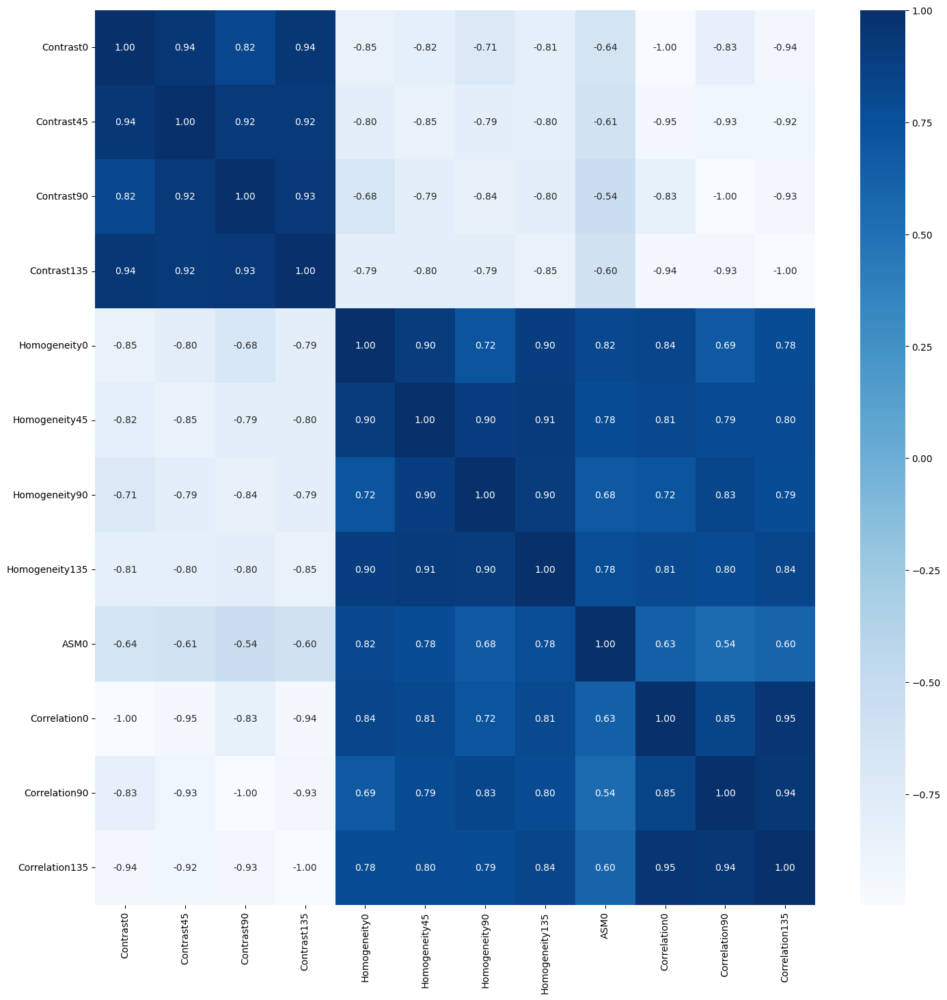

In [22]:
# Menghitung korelasi
correlation = hasilEkstrak.drop(columns=['Label','Filename']).corr()

# Menyaring fitur yang memiliki korelasi absolut lebih dari 0.95 dengan label
threshold = 0.95 # atur threshold ini untuk menentukan seberapa besar korelasi yang ingin disaring
selectionFeature = []
columns = np.full((correlation.shape[0],), True, dtype=bool)
for i in range(correlation.shape[0]):
	for j in range(i+1, correlation.shape[0]):
		if correlation.iloc[i,j] >= threshold:
			if columns[j]:
				columns[j] = False
select = hasilEkstrak.drop(columns=['Label','Filename']).columns[columns]
x_new = hasilEkstrak[select]
x_new
y = hasilEkstrak['Label']
plt.figure(figsize=(17,17))
sns.heatmap(x_new.corr(), annot=True, cmap='Blues', fmt=".2f")

### LDA

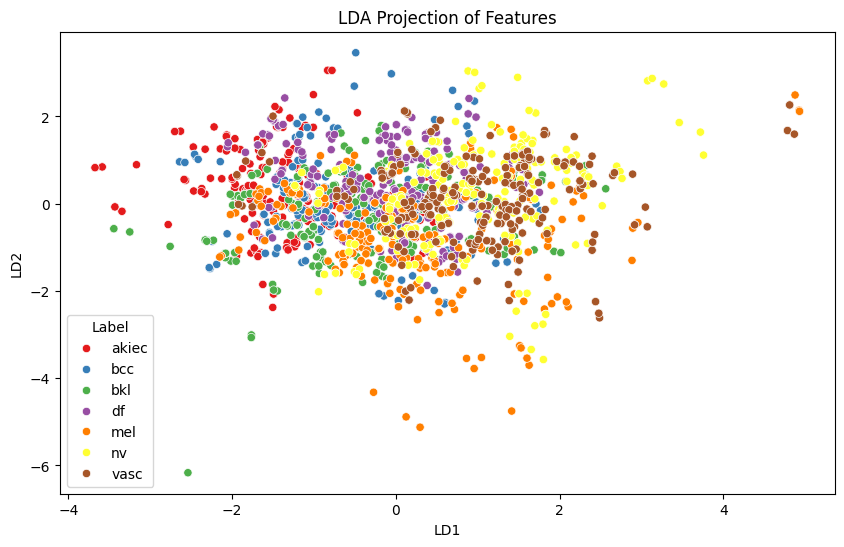

In [23]:
# Selection LDA

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

def feature_reduction_lda(dataframe, n_components=2):
    fitur = dataframe.drop(columns=['Label', 'Filename'])
    label = dataframe['Label']
    
    lda = LinearDiscriminantAnalysis(n_components=n_components)
    x_lda = lda.fit_transform(fitur, label)
    
    columns = [f'LD{i+1}' for i in range(n_components)]
    df_lda = pd.DataFrame(x_lda, columns=columns)
    df_lda['Label'] = label.values
    
    return df_lda

lda_df = feature_reduction_lda(hasilEkstrak, n_components=2)

plt.figure(figsize=(10, 6))
sns.scatterplot(data=lda_df, x='LD1', y='LD2', hue='Label', palette='Set1')
plt.title('LDA Projection of Features')
plt.xlabel('LD1')
plt.ylabel('LD2')
plt.legend(title='Label')
plt.show()

### t-SNE

c:\Users\ASUS\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


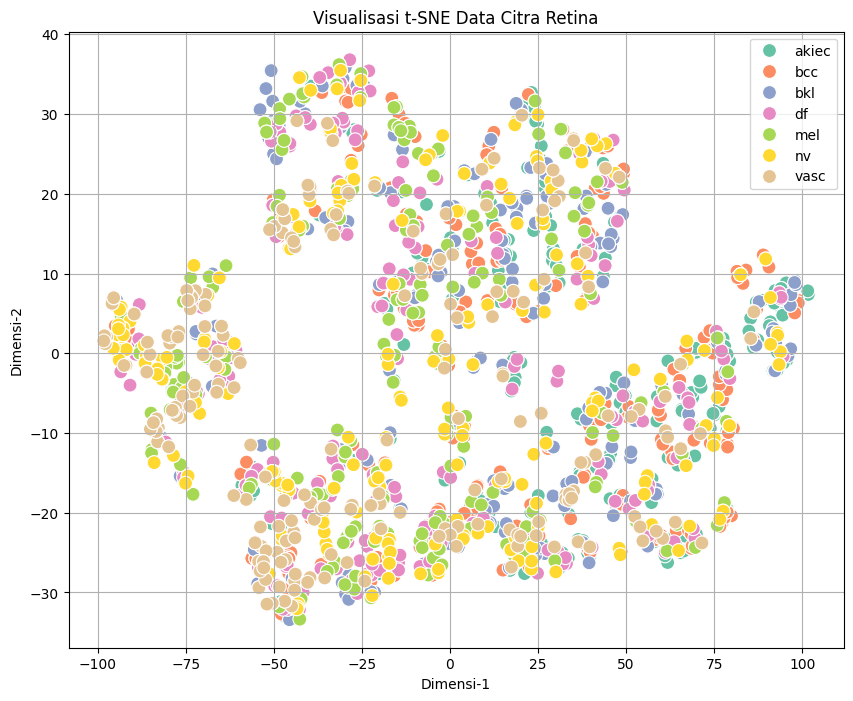

In [24]:
# Selection t-SNE

from sklearn.manifold import TSNE

# Jalankan t-SNE untuk reduksi ke 2 dimensi
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
X_tsne = tsne.fit_transform(x_new)

# Buat DataFrame hasil t-SNE
df_tsne = pd.DataFrame()
df_tsne['Dimensi-1'] = X_tsne[:, 0]
df_tsne['Dimensi-2'] = X_tsne[:, 1]
df_tsne['Label'] = y

# Plot dengan seaborn
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x='Dimensi-1', y='Dimensi-2', hue='Label', data=df_tsne, palette='Set2', s=100
)
plt.title('Visualisasi t-SNE Data Citra Retina')
plt.legend(loc='best')
plt.grid(True)
plt.show()


## Splitting Data

In [25]:
# ubah bagian test_size sesuai kebutuhan
# 0.3 = 30% data untuk testing (train/test 70/30)
# 0.2 = 20% data untuk testing (train/test 80/20)
X_train, X_test, y_train, y_test = train_test_split(x_new, y, test_size=0.2, random_state=42)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(1960, 12)
(490, 12)
(1960,)
(490,)


## Feature Normalization

In [27]:
# normalisasi mean std (Standardization / Z-score normalization)
X_test = (X_test - X_train.mean()) / X_train.std()
X_train = (X_train - X_train.mean()) / X_train.std()

## Modeling

### Define Model

In [28]:
def generateClassificationReport(y_true, y_pred):
	print(classification_report(y_true, y_pred))
	print(confusion_matrix(y_true, y_pred))
	print('Accuracy:', accuracy_score(y_true, y_pred))

# Define classifiers
rf = RandomForestClassifier(n_estimators=5, random_state=42)
svm = SVC(kernel='rbf', random_state=42)
knn = KNeighborsClassifier(n_neighbors=5)

### Train Random Forest Classifier

In [29]:
# Train Random Forest Classifier
rf.fit(X_train, y_train)

# Make predictions and evaluate the model with the training set
print("------Training Set------")
y_pred = rf.predict(X_train)
generateClassificationReport( y_train, y_pred)

# Make predictions and evaluate the model with the testing set
print("\n------Testing Set------")
y_pred = rf.predict(X_test)
generateClassificationReport( y_test, y_pred)

------Training Set------
              precision    recall  f1-score   support

       akiec       0.96      0.98      0.97       282
         bcc       0.99      0.98      0.98       271
         bkl       0.97      0.97      0.97       279
          df       0.96      0.99      0.97       285
         mel       0.98      0.96      0.97       284
          nv       0.99      0.97      0.98       269
        vasc       1.00      0.99      1.00       290

    accuracy                           0.98      1960
   macro avg       0.98      0.98      0.98      1960
weighted avg       0.98      0.98      0.98      1960

[[276   0   2   4   0   0   0]
 [  4 265   0   1   0   1   0]
 [  2   3 272   1   0   1   0]
 [  1   0   1 282   0   1   0]
 [  3   0   3   4 274   0   0]
 [  1   1   1   1   4 261   0]
 [  0   0   0   1   1   0 288]]
Accuracy: 0.9785714285714285

------Testing Set------
              precision    recall  f1-score   support

       akiec       0.71      0.91      0.80        

### Train SVM Classifier

In [30]:
# Train SVM Classifier
svm.fit(X_train, y_train)

# Make predictions and evaluate the model with the training set
print("\n------Training Set------")
y_pred = svm.predict(X_train)
generateClassificationReport( y_train, y_pred)

# Make predictions and evaluate the model with the testing set
print("\n------Testing Set------")
y_pred = svm.predict(X_test)
generateClassificationReport( y_test, y_pred)


------Training Set------
              precision    recall  f1-score   support

       akiec       0.33      0.71      0.45       282
         bcc       0.31      0.10      0.15       271
         bkl       0.26      0.25      0.26       279
          df       0.32      0.43      0.37       285
         mel       0.42      0.34      0.38       284
          nv       0.42      0.19      0.26       269
        vasc       0.45      0.40      0.42       290

    accuracy                           0.35      1960
   macro avg       0.36      0.35      0.33      1960
weighted avg       0.36      0.35      0.33      1960

[[201   9  28  29  12   3   0]
 [117  27  38  49  19  15   6]
 [ 76  20  71  38  35  20  19]
 [ 79  14  19 122  24   4  23]
 [ 61   6  14  45  97  17  44]
 [ 19   5  63  54  28  52  48]
 [ 54   5  41  43  17  14 116]]
Accuracy: 0.35

------Testing Set------
              precision    recall  f1-score   support

       akiec       0.30      0.65      0.41        68
         b

### Train KNN Classifier

In [31]:
# Train KNN Classifier
knn.fit(X_train, y_train)

# Make predictions and evaluate the model with the training set
print("\n------Training Set------")
y_pred = knn.predict(X_train)
generateClassificationReport( y_train, y_pred)

# Make predictions and evaluate the model with the testing set
print("\n------Testing Set------")
y_pred = knn.predict(X_test)
generateClassificationReport( y_test, y_pred)



------Training Set------
              precision    recall  f1-score   support

       akiec       0.67      0.83      0.74       282
         bcc       0.66      0.76      0.70       271
         bkl       0.70      0.75      0.73       279
          df       0.66      0.65      0.66       285
         mel       0.69      0.63      0.66       284
          nv       0.76      0.65      0.70       269
        vasc       0.82      0.67      0.74       290

    accuracy                           0.70      1960
   macro avg       0.71      0.70      0.70      1960
weighted avg       0.71      0.70      0.70      1960

[[234  11   8  13   8   8   0]
 [ 20 205   6  15  12  10   3]
 [ 19  13 209  13   7   9   9]
 [ 22  32  24 185   6   8   8]
 [ 31  24  12  20 179   3  15]
 [ 18  16  16  17  22 174   6]
 [  5  11  22  16  26  17 193]]
Accuracy: 0.7035714285714286

------Testing Set------
              precision    recall  f1-score   support

       akiec       0.43      0.56      0.49       

## Evaluasi Dengan Confussion Matrix

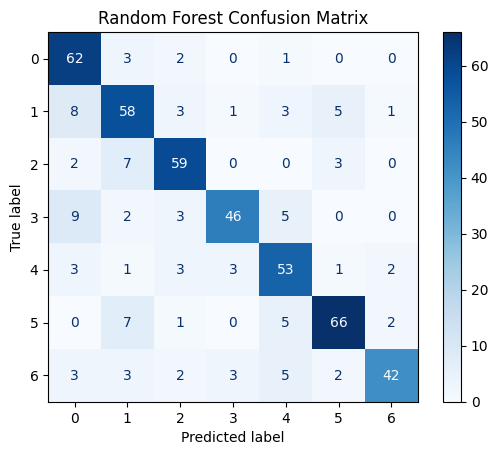

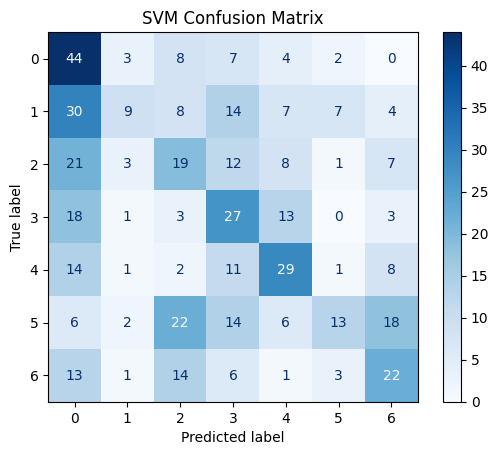

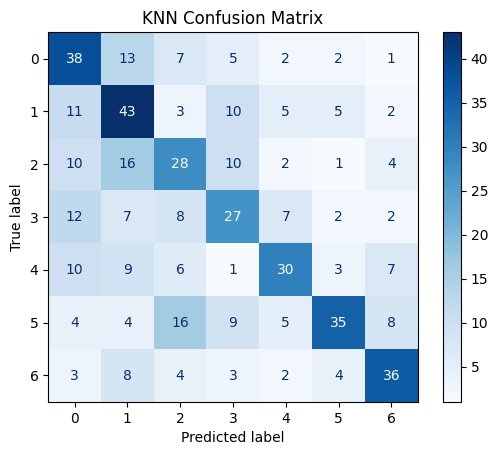

In [32]:
def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.title(title)
    plt.show()

# Plot confusion matrix for Random Forest
plot_confusion_matrix(y_test, rf.predict(X_test), "Random Forest Confusion Matrix")
# Plot confusion matrix for SVM
plot_confusion_matrix(y_test, svm.predict(X_test), "SVM Confusion Matrix")
# Plot confusion matrix for KNN
plot_confusion_matrix(y_test, knn.predict(X_test), "KNN Confusion Matrix")